In [3]:
# Install Detectron2
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-058sb8g9
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-058sb8g9
  Resolved https://github.com/facebookresearch/detectron2.git to commit 20a6625b339c7787aac6c5536e0e613170226483
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.8/427.8 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 48.

# 1. Importing Libraries 

In [4]:
# Import necessary libraries
import cv2
import os
import shutil
import torch
import json  # Ensure json is imported
from sklearn.model_selection import train_test_split
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_train_loader
from detectron2.data.datasets import register_coco_instances
from detectron2 import model_zoo  # Ensure model_zoo is imported
import yaml

# 2. Checking GPU Availability

In [5]:
# Check if GPU is available
assert torch.cuda.is_available(), "CUDA is not available. Please enable a GPU Runtime in Kaggle."

# 3. Defining Paths and Creating Output Directories

In [6]:
# Define base directory for input data and output directory for processed data
base_dir = '/kaggle/input/labelled-dataset-crack-detection/labelled_dataset'
output_dir = '/kaggle/working/crack-detection-faster-RCNN'
train_dir = os.path.join(output_dir, 'train')
val_dir = os.path.join(output_dir, 'val')
test_dir = os.path.join(output_dir, 'test')

# Create output directories for images and labels
os.makedirs(os.path.join(train_dir, 'images'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'labels'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'images'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'labels'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'images'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'labels'), exist_ok=True)

# 4. Organizing Dataset into Train, Val, and Test Sets

In [7]:
# Get all image files from the base directory
images = [f for f in os.listdir(base_dir) if f.endswith('.JPG')]

# Split the dataset into train (70%), val (15%), and test (15%)
train_images, temp_images = train_test_split(images, test_size=0.3, random_state=42)
val_images, test_images = train_test_split(temp_images, test_size=0.5, random_state=42)

# Function to move images and labels to their respective directories
def move_files(image_list, destination_dir):
    for image in image_list:
        label = image.replace('.JPG', '.json')
        shutil.copy(os.path.join(base_dir, image), os.path.join(destination_dir, 'images', image))
        shutil.copy(os.path.join(base_dir, label), os.path.join(destination_dir, 'labels', label))

# Move files to their respective directories
move_files(train_images, train_dir)
move_files(val_images, val_dir)
move_files(test_images, test_dir)

print("Dataset organized successfully!")

Dataset organized successfully!


# 5. Creating COCO Format Annotations

In [8]:
# Function to create COCO format JSON annotations from existing label files
def create_coco_json(image_dir, label_dir, output_json):
    images = []
    annotations = []
    categories = [
        {"id": 0, "name": "minor crack"},
        {"id": 1, "name": "major crack"},
        {"id": 2, "name": "no crack"}
    ]

    image_id = 0
    annotation_id = 0

    for image_file in os.listdir(image_dir):
        if image_file.endswith('.JPG'):
            # Create image entry with dynamic dimensions
            image_path = os.path.join(image_dir, image_file)
            img = cv2.imread(image_path)
            height, width = img.shape[:2]  # Get actual dimensions

            image_id += 1
            images.append({
                "id": image_id,
                "file_name": image_file,
                "width": width,
                "height": height,
            })

            # Load corresponding JSON label file
            label_file = os.path.join(label_dir, image_file.replace('.JPG', '.json'))
            if os.path.exists(label_file):
                with open(label_file) as f:
                    labels = json.load(f)

                # Process each shape in the 'shapes' list
                for shape in labels.get('shapes', []):
                    annotation_id += 1
                    label_name = shape['label']
                    
                    # Get category ID based on label name
                    category_id = next((cat['id'] for cat in categories if cat['name'] == label_name), None)

                    if category_id is not None:
                        # Extract points and create a bounding box from the polygon points.
                        points = shape['points']
                        x_coords = [point[0] for point in points]
                        y_coords = [point[1] for point in points]
                        
                        x_min = min(x_coords)
                        y_min = min(y_coords)
                        x_max = max(x_coords)
                        y_max = max(y_coords)

                        # Create annotation entry for COCO format.
                        annotations.append({
                            "id": annotation_id,
                            "image_id": image_id,
                            "category_id": category_id,
                            "bbox": [x_min, y_min, x_max - x_min, y_max - y_min],  # [x,y,width,height]
                            "area": (x_max - x_min) * (y_max - y_min),  # Calculate area.
                            "iscrowd": 0,
                        })

    coco_format = {
        "images": images,
        "annotations": annotations,
        "categories": categories,
    }

    with open(output_json, 'w') as f:
        json.dump(coco_format, f)

# Define paths for COCO format JSON creation.
train_images_dir = os.path.join(train_dir, 'images')
train_labels_dir = os.path.join(train_dir, 'labels')
val_images_dir = os.path.join(val_dir, 'images')
val_labels_dir = os.path.join(val_dir, 'labels')

# Create COCO format JSON files for training and validation sets.
create_coco_json(train_images_dir, train_labels_dir, os.path.join(train_labels_dir, '_annotations.coco.json'))
create_coco_json(val_images_dir, val_labels_dir, os.path.join(val_labels_dir, '_annotations.coco.json'))

print("COCO format annotation files created successfully!")

COCO format annotation files created successfully!


# 6. Registering Datasets in Detectron2

In [9]:
# Register the datasets in COCO format using Detectron2's registration function.
register_coco_instances("cube_train", {}, os.path.join(train_labels_dir, '_annotations.coco.json'), train_images_dir)
register_coco_instances("cube_val", {}, os.path.join(val_labels_dir, '_annotations.coco.json'), val_images_dir)

print("Datasets registered successfully!")

Datasets registered successfully!


# 7. Configuring the Model for Training

In [11]:
# Set up configuration for training the model using Detectron2.
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cube_train",)
cfg.DATASETS.TEST = ("cube_val",)  # Validation during training.

cfg.DATALOADER.NUM_WORKERS = 2

# Number of classes (adjust according to your dataset).
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3

# Pre-trained weights from COCO dataset.
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # Adjust learning rate as needed.
cfg.SOLVER.MAX_ITER = 1000     # Adjust the number of iterations as needed.
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Adjust threshold.

# Output directory for the model's checkpoints.
cfg.OUTPUT_DIR = "./output"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# 8. Initializing Trainer and Start Training

In [12]:
# Initialize trainer and start training.
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

print("Training completed successfully!")

model_final_280758.pkl: 167MB [00:01, 121MB/s]                               
/opt/conda/lib/python3.10/site-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Training completed successfully!


# Evaluation

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("cube_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "cube_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.328
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.328
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.5

OrderedDict([('bbox',
              {'AP': 30.07560279837508,
               'AP50': 32.77349712993278,
               'AP75': 32.77349712993278,
               'APs': nan,
               'APm': nan,
               'APl': 30.07560279837508,
               'AP-minor crack': 4.158415841584159,
               'AP-major crack': 0.0,
               'AP-no crack': 86.06839255354107})])

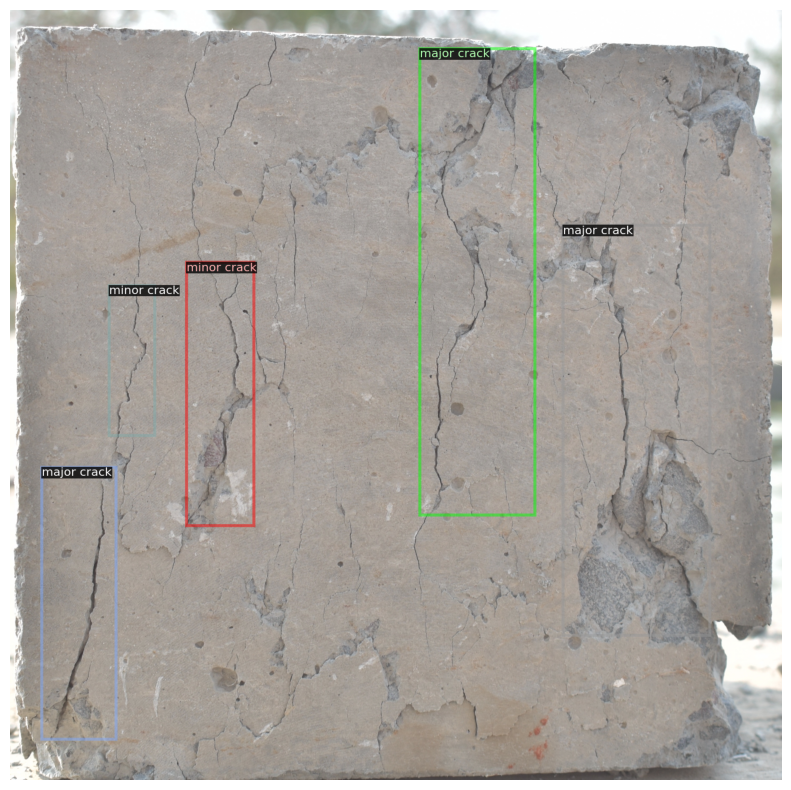

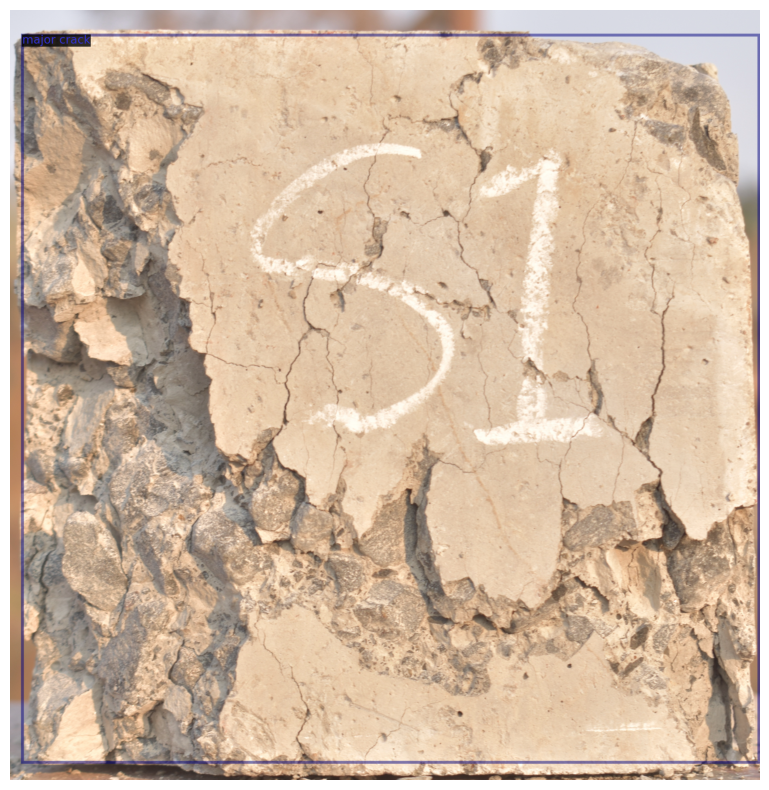

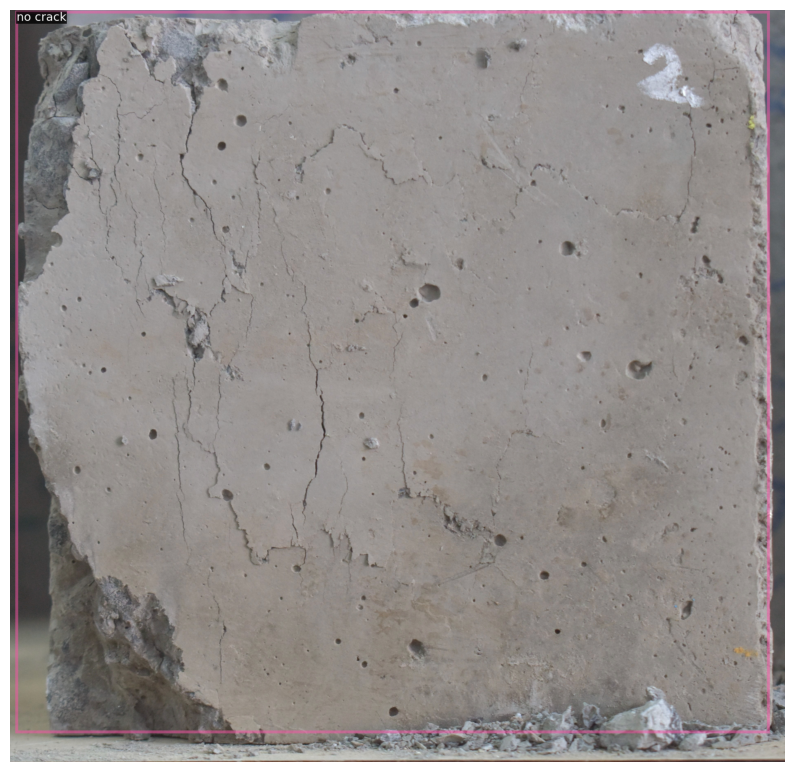

In [15]:
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

# Define metadata for visualization
cube_metadata = MetadataCatalog.get("cube_train")  # Use the training dataset metadata

# Load the validation dataset
dataset_dicts = DatasetCatalog.get("cube_val")

# Loop through 3 random samples
for d in random.sample(dataset_dicts, 3):    
    img = cv2.imread(d["file_name"])
    
    # Visualize using Detectron2's Visualizer
    visualizer = Visualizer(img[:, :, ::-1], metadata=cube_metadata, scale=0.5, instance_mode=ColorMode.IMAGE)
    vis = visualizer.draw_dataset_dict(d)
    
    # Convert image to RGB (from BGR) for matplotlib
    vis_img_rgb = vis.get_image()[:, :, ::-1]
    
    # Display the image using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(vis_img_rgb)
    plt.axis('off')
    plt.show()

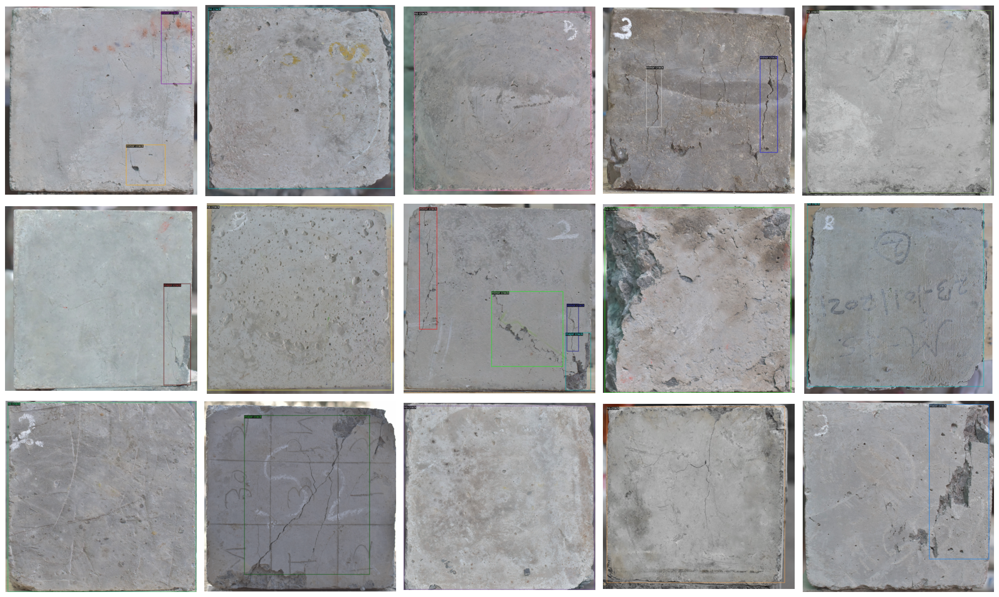

In [16]:
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

# Define metadata for visualization
cube_metadata = MetadataCatalog.get("cube_train")  # Use the training dataset metadata

# Load the validation dataset
dataset_dicts = DatasetCatalog.get("cube_val")

# Randomly select 15 samples
sampled_dicts = random.sample(dataset_dicts, 15)

# Set up the figure for a 3x5 grid
fig, axs = plt.subplots(3, 5, figsize=(20, 12))  # Adjust size as needed

# Loop through each sampled dictionary and plot the images
for ax, d in zip(axs.flatten(), sampled_dicts):
    img = cv2.imread(d["file_name"])
    
    # Visualize using Detectron2's Visualizer
    visualizer = Visualizer(img[:, :, ::-1], metadata=cube_metadata, scale=0.5, instance_mode=ColorMode.IMAGE)
    vis = visualizer.draw_dataset_dict(d)
    
    # Convert image to RGB (from BGR) for matplotlib
    vis_img_rgb = vis.get_image()[:, :, ::-1]
    
    # Display the image on the subplot
    ax.imshow(vis_img_rgb)
    ax.axis('off')  # Hide axes

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_1.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_2.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_3.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_4.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_5.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_6.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_7.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_8.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_9.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_10.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_11.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/output_image_12.png
Saved: /kaggle/working/faster-rcnn-crack-detection-outputs/ou

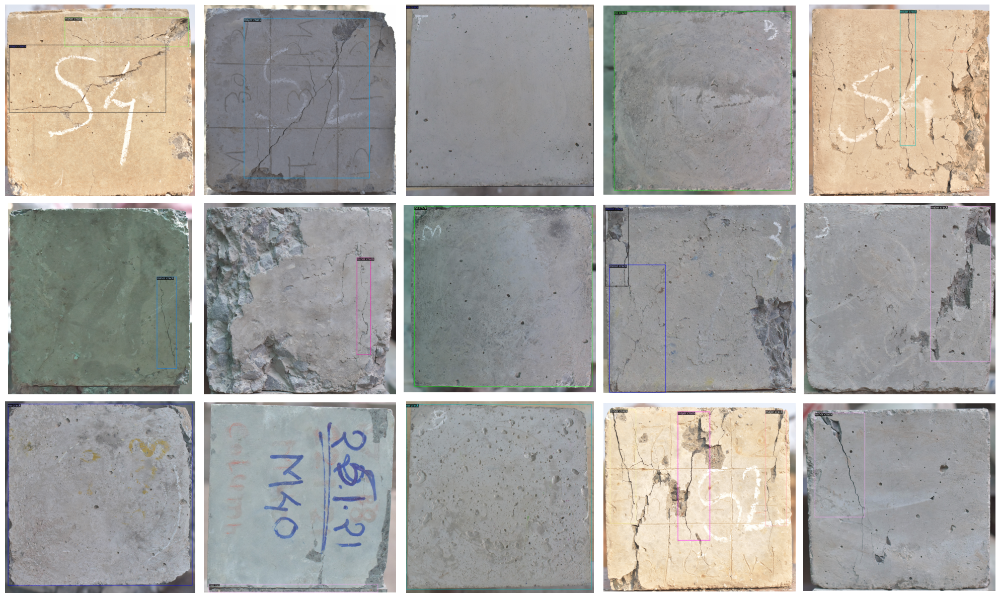

In [17]:
import random
import cv2
import os
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

# Define metadata for visualization
cube_metadata = MetadataCatalog.get("cube_train")  # Use the training dataset metadata

# Load the validation dataset
dataset_dicts = DatasetCatalog.get("cube_val")

# Define output directory for saving images
output_dir = '/kaggle/working/faster-rcnn-crack-detection-outputs'
os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist

# Randomly select 15 samples
sampled_dicts = random.sample(dataset_dicts, 15)

# Loop through each sampled dictionary and save the images
for i, d in enumerate(sampled_dicts):
    img = cv2.imread(d["file_name"])
    
    # Visualize using Detectron2's Visualizer
    visualizer = Visualizer(img[:, :, ::-1], metadata=cube_metadata, scale=0.5, instance_mode=ColorMode.IMAGE)
    vis = visualizer.draw_dataset_dict(d)
    
    # Convert image to RGB (from BGR) for matplotlib
    vis_img_rgb = vis.get_image()[:, :, ::-1]
    
    # Save the visualized image to the output directory
    output_file_path = os.path.join(output_dir, f'output_image_{i + 1}.png')
    cv2.imwrite(output_file_path, vis_img_rgb)  # Save using OpenCV
    
    print(f"Saved: {output_file_path}")

# Optionally display the images in a grid
fig, axs = plt.subplots(3, 5, figsize=(20, 12))  # Adjust size as needed

for ax, d in zip(axs.flatten(), sampled_dicts):
    img = cv2.imread(d["file_name"])
    
    # Visualize using Detectron2's Visualizer
    visualizer = Visualizer(img[:, :, ::-1], metadata=cube_metadata, scale=0.5, instance_mode=ColorMode.IMAGE)
    vis = visualizer.draw_dataset_dict(d)
    
    # Convert image to RGB (from BGR) for matplotlib
    vis_img_rgb = vis.get_image()[:, :, ::-1]
    
    # Display the image on the subplot
    ax.imshow(vis_img_rgb)
    ax.axis('off')  # Hide axes

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()